In [225]:
#Load all required libarieis 
import numpy as np  #Is required to work with dataset 
import pandas as pd  #Is required for Math library
import seaborn as sns #Graph library
import matplotlib.pyplot as pltt #to plot few  parameters in the above grapbh

#Import all required libraries
import plotly.offline as py 
py.init_notebook_mode(connected=True) # this code, allow us to work with offline plotly version
import plotly.graph_objs as graphobj # it's like "plt" of matplot
import plotly.tools as tls # It's useful to we get some tools of plotly
import warnings # This library will be used to ignore some warnings
from collections import Counter # To do counter of some features

In [226]:
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)

#zero_count = 0;
#na_count = 0;
#order = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv')
#order['purpose'].value_counts()
#values = order.loc[order['purpose']=="credit_card",'verification_status']
#print(values.value_counts())
#print((values.value_counts()/values.count())*100)


In [227]:
#Looking the data
Loan_dt_set.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,initial_list_status,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,policy_code,application_type
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,f,5863.155187,5833.84,5000.00,863.16,Jan-15,171.62,May-16,1,INDIVIDUAL
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,f,1008.710000,1008.71,456.46,435.17,Apr-13,119.66,Sep-13,1,INDIVIDUAL
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,f,3005.666844,3005.67,2400.00,605.67,Jun-14,649.91,May-16,1,INDIVIDUAL
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,f,12231.890000,12231.89,10000.00,2214.92,Jan-15,357.48,Apr-16,1,INDIVIDUAL
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,f,3513.330000,3513.33,2475.94,1037.39,May-16,67.79,May-16,1,INDIVIDUAL


In [228]:
print(Loan_dt_set.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 40 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      39717 non-null  int64  
 1   member_id               39717 non-null  int64  
 2   loan_amnt               39717 non-null  int64  
 3   funded_amnt             39717 non-null  int64  
 4   funded_amnt_inv         39717 non-null  float64
 5   term                    39717 non-null  object 
 6   int_rate                39717 non-null  object 
 7   installment             39717 non-null  float64
 8   grade                   39717 non-null  object 
 9   sub_grade               39717 non-null  object 
 10  emp_title               37258 non-null  object 
 11  emp_length              38642 non-null  object 
 12  home_ownership          39717 non-null  object 
 13  annual_inc              39717 non-null  float64
 14  verification_status     39717 non-null

In [229]:
Loan_dt_set.isnull()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,initial_list_status,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,policy_code,application_type
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
39713,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
39714,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
39715,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [230]:
#To check the columns for value 0 so  to delete that columns as its not required 
Loan_dt_set.isnull().sum()

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [231]:
#Conclusion:
#As per the above out come, following columns,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit and  total_il_high_credit_limit, all nul values, they can be deleted from the CSV file.
#check for null values for all remaining columns 

In [232]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
Loan_dt_set.isnull().sum()

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [233]:
#Conclusion:
## Few more columns has been deleted manually 

In [234]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
Loan_dt_set.isnull().sum()

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [235]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
Loan_dt_set.isnull().sum()

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [236]:
#Conclusion:
## Few more columns has been deleted manually 

In [237]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [238]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [239]:
#Conclusion:
## Few more columns has been deleted manually 

In [240]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [241]:
#Conclusion:
## Few more columns has been deleted manually 

In [14]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [242]:
#Conclusion:
## Few more columns has been deleted manually 

In [245]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [246]:
#Conclusion:
## Few more columns has been deleted manually 

In [247]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum() 

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [248]:
#Conclusion:
## Few more columns has been deleted manually 

In [249]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [250]:
#Conclusion:
## Few more columns has been deleted manually 

In [251]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [252]:
#Conclusion:
## Few more columns has been deleted manually 

In [253]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [254]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [255]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [256]:
#Conclusion:
## Few more columns has been deleted manually 

In [257]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [258]:
#Conclusion:
## Few more columns has been deleted manually 

In [259]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [260]:
#Conclusion:
## Few more columns has been deleted manually 

In [261]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [262]:
#Conclusion:
## Few more columns has been deleted manually 

In [263]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [264]:
#Conclusion:
## Few more columns has been deleted manually in order to clean the data 
##Delete column URL as its not help and also its not working. Hence this column can be deleted
##Delete desc column as its not interested columns for our work. We can use purpose column 

In [265]:
#Below mentioned rows has been deleted as per the cleaning the data process 
##Loan_dt_set["verification_status_joint"].isnull().sum() # delete entire row 
##Loan_dt_set["dti_joint"].isnull().sum() # delete entire row 
##Loan_dt_set["annual_inc_joint"].isnull().sum() # delete entire row 
##Loan_dt_set["mths_since_last_major_derog"].isnull().sum() # delete entire row 
##Loan_dt_set["next_pymnt_d"].isnull().sum() # delete entire row 
##Loan_dt_set["acc_now_delinq"].sum() # This columd als odelted as its having only '0'
##Loan_dt_set["chargeoff_within_12_mths"].sum()# This columd als odelted as its having only '0'
##Loan_dt_set["delinq_amnt"].sum() # This columd als odelted as its having only '0'




In [266]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
##Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [267]:
#Conclusion:
## Few more columns has been deleted manually in order to clean the data 

In [268]:
#Check for other columns for null value to delete them provided if entire columns is null or null values are >80%
##Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
Loan_dt_set.isnull().sum()


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                  2459
emp_length                 1075
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                        11
zip_code                      0
addr_state                    0
dti                           0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq    25682
open_acc                      0
revol_bal                     0
revol_util                   50
total_acc                     0
initial_list_status           0
total_py

In [269]:
# With reference to above detaset deatils,columnd mths_since_last_record can be deleted as total null values are more than 80%
#so after deleting reload to check other columns 

#Check for other columns for total null/0 value to delete them provided if entire columns is null/0 or total null/0 values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
(Loan_dt_set == 0).sum(axis=0)


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv             129
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                     0
emp_length                    0
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                         0
zip_code                      0
addr_state                    0
dti                         183
earliest_cr_line              0
inq_last_6mths            19300
mths_since_last_delinq      443
open_acc                      0
revol_bal                   994
revol_util                    0
total_acc                     0
initial_list_status           0
total_py

In [270]:
# With reference to above detaset deatils,columnd mths_since_last_record can be deleted as total null values are more than 80%
#so after deleting reload to check other columns 

#Check for other columns for total null/0 value to delete them provided if entire columns is null/0 or total null/0 values are >80%
#Importing the csv data into pandas dataset
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan.csv',low_memory=False)
(Loan_dt_set == 0).sum(axis=0)

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv             129
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                     0
emp_length                    0
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
purpose                       0
title                         0
zip_code                      0
addr_state                    0
dti                         183
earliest_cr_line              0
inq_last_6mths            19300
mths_since_last_delinq      443
open_acc                      0
revol_bal                   994
revol_util                    0
total_acc                     0
initial_list_status           0
total_py

In [271]:
#Give appropriate column names to each mentioned below by refering the data_dictionary to make ir more readable 
##id = LCL id # LC Loan Id
##member_id = BMId # Barrower member id 
##loan_amnt = Req_Loan_Amt # Requested Loan amount by barrower 
##funded_amnt = Total_LC_Appr_loan # Toal Loan amount approved by lending agency(LC)
##funded_amnt_inv = Total_Inv_Appr_Loan # Total Loan amount approved by investors 
##term - Loan_Tenure
##installment - EMI # Monthly amount to be paid by barrower till the end Loan tenure
##emp_title = Brwr_comp_name - Borrower company name
##emp_length - Brwr_service_Length
##verification_status = LC_verification_status
##issue_d = Loan_start_date
##pymnt_plan - not required column as its does not give any value 
##purpose = Loan_purpose
##title = Loan_purpose_info  # May be this is not required now.. can be deleted
##addr_state  = Barower_State
##dti = Brwr_monthy_debt_pymt_ratio # Barrower monthly debt paymet
##earliest_cr_line = Available_Brwr_LOC # Line of creadit 
##inq_last_6mths = Brwr_total_num_inq_6mnths
##mths_since_last_delinq = 
##open_acc = Brwr_open_loc_acc_count 
##revol_util = available_revol_bal_uti_rate
##total_acc = Total_num_LOC_brwr_acc
##total_pymnt = Total_rec_emi
##total_pymnt_inv = Total_amt_rece_by_investors
##total_rec_prncp = Total_Principal_amt_received
##total_rec_int = Total_interest_recevied 
##last_pymnt_d = Last_emi_rec_mnth
##last_pymnt_amnt =Last_rec_EMI_amt
##last_credit_pull_d = Last_generated_credit_hst_dt

##also need to delete all rows corresponding to current account as its not in the scope of this assignment 

##Loan.csv file has been saved as loan_updated.csv
##So will be using loan_updated.csv file going forward


In [272]:
#Load the dataset into Pandas and display the columns who's sum is 0
Loan_dt_set = pd.read_csv('C:\\LEKHANA\\AIML\\loan_updated.csv')
(Loan_dt_set == 0).sum(axis=0)

LC_Loan_id                          0
Barower_id                          0
Requested_Loan_Amt                  0
Total_LC_Apprd_loan                 0
Total_Inv_Apprd_Loan              129
Loan_Tenure                         0
int_rate                            0
EMI                                 0
grade                               0
sub_grade                           0
Brwr_company_name                   0
Brwr_service_Length                 0
home_ownership                      0
Barower_CTC                         0
LC_app_verification_status          0
Loan_start_date                     0
loan_status                         0
Loan_purpose                        0
Loan_purpose_info                   0
zip_code                            0
Barower_State                       0
Brwr_monthy_debt_pymt_ratio       178
Available_Brwr_LOC                  0
Brwr_total_num_inq_6mnths       18709
mths_since_last_delinq            443
Brwr_open_loc_acc_count             0
revol_bal   

In [273]:
#Display the dataset
Loan_dt_set.head()

,LC_Loan_id,Barower_id,Requested_Loan_Amt,Total_LC_Apprd_loan,Total_Inv_Apprd_Loan,Loan_Tenure,int_rate,EMI,grade,sub_grade,...,Total_num_LOC_brwr_acc,Total_rec_emi,Total_amt_rece_by_investors,Total_Principal_amt_received,Total_interest_recevied,Last_emi_rec_mnth,Last_rec_EMI_amt,Last_generated_credit_hst_dt,policy_code,application_type
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,9,5863.155187,5833.84,5000.00,863.16,Jan-15,171.62,May-16,1,INDIVIDUAL
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,4,1008.710000,1008.71,456.46,435.17,Apr-13,119.66,Sep-13,1,INDIVIDUAL
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,10,3005.666844,3005.67,2400.00,605.67,Jun-14,649.91,May-16,1,INDIVIDUAL
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,37,12231.890000,12231.89,10000.00,2214.92,Jan-15,357.48,Apr-16,1,INDIVIDUAL
4,1075269,1311441,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,...,12,5632.210000,5632.21,5000.00,632.21,Jan-15,161.03,Jan-16,1,INDIVIDUAL


In [274]:
#check the values of 'initial_list_status' column value..if only 'f' then ..this column can be deleted.
#Loan_dt_set["initial_list_status"].value_counts()

In [275]:
#Search for missing values again to check space 
print(Loan_dt_set.head())

   LC_Loan_id  Barower_id  Requested_Loan_Amt  Total_LC_Apprd_loan  \
0     1077501     1296599                5000                 5000   
1     1077430     1314167                2500                 2500   
2     1077175     1313524                2400                 2400   
3     1076863     1277178               10000                10000   
4     1075269     1311441                5000                 5000   

   Total_Inv_Apprd_Loan Loan_Tenure int_rate     EMI grade sub_grade  ...  \
0                4975.0   36 months   10.65%  162.87     B        B2  ...   
1                2500.0   60 months   15.27%   59.83     C        C4  ...   
2                2400.0   36 months   15.96%   84.33     C        C5  ...   
3               10000.0   36 months   13.49%  339.31     C        C1  ...   
4                5000.0   36 months    7.90%  156.46     A        A4  ...   

  Total_num_LOC_brwr_acc Total_rec_emi Total_amt_rece_by_investors  \
0                      9   5863.155187        

In [276]:
#Plot scatter diagram to check outliers.. doing it for CTC only.Because thats is the ideal candidate to have outliers in this case
#Conclusion: From the below scatter graph, its evident that there are few outliers in the CTC data set. But not taking any action on them
datas = graphobj.Scatter(y=Loan_dt_set["Barower_CTC"],
                         x=Loan_dt_set["Brwr_service_Length"],
                         mode='markers'
                          )
#graphobj.Figure(data=datas)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, subplot_titles=(''))#setting the figs
fig.append_trace(datas, 1, 1)

fig['layout'].update(showlegend=True, title='CTC outliers', bargap=0.09)
py.iplot(fig, filename='LCB CTC Scatters')

plt.show()

C:\LEKHANA\Nataraj\AIML\lib\site-packages\plotly\tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



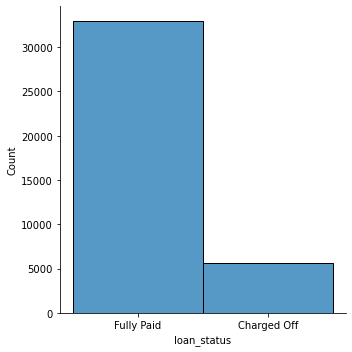

In [277]:
# Univariate analysis to find the total number 'Charged off ' and 'Full Paid' lons in the loan dataset
#Conclusion: In the Loan data set, there are more than 30000 Loan status as Fully paid and more than 5000 loan status as Charged Off
df_charged_off = Loan_dt_set[Loan_dt_set["loan_status"]=='Charged Off']
df_fully_paid =  Loan_dt_set[Loan_dt_set["loan_status"]=='Fully Paid']

sb0 = sns.displot(x=Loan_dt_set["loan_status"], data=Loan_dt_set);

                             

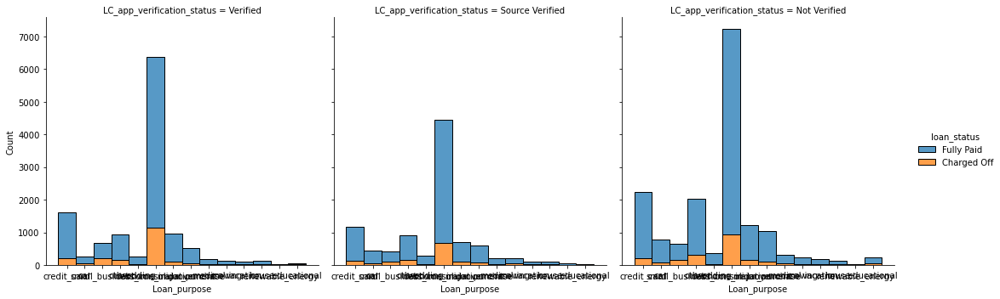

In [278]:
sb0 = sns.displot(x=Loan_dt_set["Loan_purpose"], data=Loan_dt_set,hue=Loan_dt_set["loan_status"],col=Loan_dt_set["LC_app_verification_status"], multiple="stack");


In [279]:
#Bivariae analysis using Loan status and app verification status.Intent is see which accounts more charged off loans
#Conclusion:Verified applicants account for more charged off compared others verification status but not that great difference

X0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["LC_app_verification_status"].value_counts().index.values
Y0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["LC_app_verification_status"].value_counts().values

X1  = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["LC_app_verification_status"].value_counts().index.values
Y1 =  Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["LC_app_verification_status"].value_counts().values



#First plot
bar0 = graphobj.Bar(
                    x = X0,
                    y = Y0,
                    name="Charged Off loan "
                    )

bar1 = graphobj.Bar(
                    x = X1,
                    y = Y1,
                    name="Fully Paid"
                    )


data=[bar0,bar1]

layout = graphobj.Layout(
                        xaxis_title='Verification status',
                        yaxis_title ="Count of Loans",
                        title='Verification Vs Loan Status'
                        )
fig = graphobj.Figure(data=data,layout=layout)

py.iplot(fig,filename='grouped-bar')
plt.show()

In [300]:
#Bivariate analysis of Loan status with application verification status. 
df_charged_off = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']['LC_app_verification_status'].values.tolist()
df_fully_paid =Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']['LC_app_verification_status'].values.tolist()
df_varification_status = Loan_dt_set['LC_app_verification_status']

#First plot
hist0 = graphobj.Histogram(
    x=df_charged_off,
    histnorm='probability',
    name="Charged Off loan "
)

#Second plot
hist1 = graphobj.Histogram(
    x=df_fully_paid,
    histnorm='probability',
    name="Fully Paid loan "
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, 
                          subplot_titles=('Loan Purpose',''))#setting the figs
fig.append_trace(hist0, 1, 1)
fig.append_trace(hist1, 1, 2)

fig['layout'].update(showlegend=True, title='Loan vs Verification Status ', bargap=0.09)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')


In [281]:
#From above histogram, its evident that 

In [311]:
#Univariate analysis to find the count of each applicants purpose for the loan
#Conclusion: Helps to infere and relate 
ccbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'credit_card']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'credit_card'].value_counts().values,
                    name='Credit card loan '
                    )
#print(ccbar)

sbbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'small_business']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'small_business']["Loan_purpose"].value_counts().values,
                    name='Small business loan '
                    )

othbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'other']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'other'].value_counts().values,
                    name='Other loan '
                    )

wedbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'wedding']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'wedding']["Loan_purpose"].value_counts().values,
                    name='Wedding type loan '
                    )
debtbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'debt_consolidation']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'debt_consolidation']["Loan_purpose"].value_counts().values,
                    name='Debt consolidation loan '
                    )

hibar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'home_improvement']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'home_improvement']["Loan_purpose"].value_counts().values,
                    name='Home Improvement loan '
                    )

mpbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'major_purchase']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'major_purchase']["Loan_purpose"].value_counts().values,
                    name='Major Purchase loan '
                    )

medbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'medical']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'medical']["Loan_purpose"].value_counts().values,
                    name='Medical loan '
                    )

movbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'moving']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'moving']["Loan_purpose"].value_counts().values,
                    name='Moving loan '
                    )

renbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'renewable_energy']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'renewable_energy']["Loan_purpose"].value_counts().values,
                    name='Renewable Energy loan '
                    )

vacbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'vacation']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'vacation']["Loan_purpose"].value_counts().values,
                    name='Vacation loan '
                    )

edubar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'educational']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'educational']["Loan_purpose"].value_counts().values,
                    name='Educational loan '
                    )

housebar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'house']["Loan_purpose"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'house']["Loan_purpose"].value_counts().values,
                    name='House loan '
                    )


datas = [ccbar, sbbar,othbar,wedbar,debtbar,hibar,mpbar,medbar,movbar,renbar,vacbar,edubar,housebar]


layouts = graphobj.Layout(
                        xaxis_title='Loan purpose count',
                        yaxis_title ="Loan Purpose",
                        title='Loan purpose status'
                        )
figs = graphobj.Figure(data=datas,layout=layouts)

py.iplot(figs,filename='Loan purpose-bar')
plt.show()


In [313]:
#Bivariate analysis to find which loan purpose accounts for more defaults,i.e charged off loans
#Conclusion: From the below bar graphs, its clearly evident that debt consolidation accounts for more loans and also accounts for 
#Maximum charged off loans.
ccbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'credit_card']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'credit_card']["loan_status"].value_counts().values,
                    name='Credit card loan '
                    )

sbbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'small_business']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'small_business']["loan_status"].value_counts().values,
                    name='Small business loan '
                    )

othbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'other']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'other']["loan_status"].value_counts().values,
                    name='Other loan '
                    )

wedbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'wedding']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'wedding']["loan_status"].value_counts().values,
                    name='Wedding type loan '
                    )
debtbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'debt_consolidation']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'debt_consolidation']["loan_status"].value_counts().values,
                    name='Debt consolidation loan '
                    )

hibar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'home_improvement']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'home_improvement']["loan_status"].value_counts().values,
                    name='Home Improvement loan '
                    )

mpbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'major_purchase']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'major_purchase']["loan_status"].value_counts().values,
                    name='Major Purchase loan '
                    )

medbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'medical']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'medical']["loan_status"].value_counts().values,
                    name='Medical loan '
                    )

movbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'moving']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'moving']["loan_status"].value_counts().values,
                    name='Moving loan '
                    )

renbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'renewable_energy']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'renewable_energy']["loan_status"].value_counts().values,
                    name='Renewable Energy loan '
                    )

vacbar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'vacation']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'vacation']["loan_status"].value_counts().values,
                    name='Vacation loan '
                    )

edubar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'educational']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'educational']["loan_status"].value_counts().values,
                    name='Educational loan '
                    )

housebar = graphobj.Bar(
                    x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'house']["loan_status"].value_counts().index.values,
                    y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'house']["loan_status"].value_counts().values,
                    name='House loan '
                    )


datas = [ccbar, sbbar,othbar,wedbar,debtbar,hibar,mpbar,medbar,movbar,renbar,vacbar,edubar,housebar]


layouts = graphobj.Layout(
                        xaxis_title='Loan Status',
                        yaxis_title ="Loan Purpose",
                        title='Loan purpose vs Loan status'
                        )
figs = graphobj.Figure(data=datas,layout=layouts)

py.iplot(figs,filename='Loan purpose-bar')
plt.show()



In [283]:
#From above graph, it clearly evident that Debt consolidation Loan is majorly charged off and House loan type also charged off 
#which is in second place. So Loan against to these type of loan must be evaluated before lending money.

In [284]:
#Same as above but trying to draw Box instead of Bar
ccbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'credit_card']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'credit_card']["loan_status"].value_counts().values,
            name='Credit card loan '
    )

sbbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'small_business']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'small_business']["loan_status"].value_counts().values,
            name='Small business loan '
    )

othbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'other']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'other']["loan_status"].value_counts().values,
            name='Other loan '
    )

wedbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'wedding']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'wedding']["loan_status"].value_counts().values,
            name='Wedding type loan '
    )
debtbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'debt_consolidation']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'debt_consolidation']["loan_status"].value_counts().values,
            name='Debt consolidation loan '
    )

hibar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'home_improvement']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'home_improvement']["loan_status"].value_counts().values,
            name='Home Improvement loan '
    )

mpbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'major_purchase']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'major_purchase']["loan_status"].value_counts().values,
            name='Major Purchase loan '
    )

medbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'medical']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'medical']["loan_status"].value_counts().values,
            name='Medical loan '
    )

movbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'moving']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'moving']["loan_status"].value_counts().values,
            name='Moving loan '
    )

renbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'renewable_energy']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'renewable_energy']["loan_status"].value_counts().values,
            name='Renewable Energy loan '
    )

vacbar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'vacation']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'vacation']["loan_status"].value_counts().values,
            name='Vacation loan '
    )

edubar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'educational']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'educational']["loan_status"].value_counts().values,
            name='Educational loan '
    )

housebar = graphobj.Box(
            x = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'house']["loan_status"].value_counts().index.values,
            y = Loan_dt_set[Loan_dt_set["Loan_purpose"]== 'house']["loan_status"].value_counts().values,
            name='House loan '
    )


data = [ccbar, sbbar,othbar,wedbar,debtbar,hibar,mpbar,medbar,movbar,renbar,vacbar,edubar,housebar]


layout = graphobj.Layout(
    
)

layout = graphobj.Layout(
    yaxis=dict(
        title='Loan purpose count'
    ),
    xaxis=dict(
        title='Loan Status'
    ),
    title='All Purpose loan status'
)

fig = graphobj.Figure(data=data, layout=layout)

 
py.iplot(fig, filename='grouped-bar')

In [285]:
#Analyse the relationship between service length and impact on Loan status
#Bivariate analysis of Loan status with barrowers service length. 
#Conclusion: From the below graphs, the barrowe having 10 or 10+ years experience are charged off from their loans.
#This can be linkned to above where max amount of Loans charged off are with Debt consolidations 
#Also the barrowers with 10 or 10+ years of experience accounts heighest for fully paid loans 

X0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["Brwr_service_Length"].value_counts().index.values
Y0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["Brwr_service_Length"].value_counts().values

X1  = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["Brwr_service_Length"].value_counts().index.values
Y1 =  Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["Brwr_service_Length"].value_counts().values


#First plot
bar0 = graphobj.Bar(
                    x = X0,
                    y = Y0,
                    name="Charged Off loan "
                    )

bar1 = graphobj.Bar(
                    x = X1,
                    y = Y1,
                    name="Fully Paid"
                    )


data=[bar0,bar1]

layout = graphobj.Layout(
                        xaxis_title='Service Length',
                        yaxis_title ="Count of Loans",
                        title='Service Length Vs Loan Status'
                        )
fig = graphobj.Figure(data=data,layout=layout)

py.iplot(fig,filename='grouped-bar')
plt.show()

In [286]:
#Analysis the various grades given LC on Loan Status
#Bivariate analysis - Below graph shows the LC grade B,C and D are accounts for more Charged off loans.On the other hand,
#grade barrower accounts for more loans,B,C and D

X0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["grade"].value_counts().index.values
Y0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["grade"].value_counts().values

X1  = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["grade"].value_counts().index.values
Y1 =  Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["grade"].value_counts().values


#First plot
bar0 = graphobj.Bar(
                    x = X0,
                    y = Y0,
                    name="Charged Off loan "
                    )

bar1 = graphobj.Bar(
                    x = X1,
                    y = Y1,
                    name="Fully Paid"
                    )


data=[bar0,bar1]

layout = graphobj.Layout(
                        xaxis_title='Grade',
                        yaxis_title ="Count of Loans",
                        title='Barrowers Grade Vs Loan Status'
                        )
fig = graphobj.Figure(data=data,layout=layout)

py.iplot(fig,filename='grouped-bar')
plt.show()



In [314]:
#Bivariate Analysis of subgrades -of above top three grades-B,C and D , with  Loan Status to check sub-grade which is accounted 
#more Charged off loans
#conclusion: subgrades B5,B3,C1,B4,C2,D2 C3 etc are counted for more charged off loans
X0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["sub_grade"].value_counts().index.values
Y0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["sub_grade"].value_counts().values

X1  = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["sub_grade"].value_counts().index.values
Y1 =  Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["sub_grade"].value_counts().values


#First plot
bar0 = graphobj.Bar(
                    x = X0,
                    y = Y0,
                    name="Charged Off loan "
                    )

bar1 = graphobj.Bar(
                    x = X1,
                    y = Y1,
                    name="Fully Paid"
                    )


data=[bar0,bar1]

layout = graphobj.Layout(
                        xaxis_title='Grade',
                        yaxis_title ="Count of Loans",
                        title='Sub grade Vs Loan status'
                        )
fig = graphobj.Figure(data=data,layout=layout)

py.iplot(fig,filename='grouped-bar')
plt.show()




In [315]:
#Bivariate analysis of interest rates with Loan status to analyse higher charged off loans.
#Conclusion: From the below graphs, more interests rate (grade B,C and D) are accountable for more charged off loans
X0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["int_rate"].value_counts().index.values
Y0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["int_rate"].value_counts().values

X1  = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["int_rate"].value_counts().index.values
Y1 =  Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["int_rate"].value_counts().values


#First plot
bar0 = graphobj.Bar(
                    x = X0,
                    y = Y0,
                    name="Charged Off loan "
                    )

bar1 = graphobj.Bar(
                    x = X1,
                    y = Y1,
                    name="Fully Paid"
                    )


data=[bar1,bar0]

layout = graphobj.Layout(
                        xaxis_title='Interest Rate',
                        yaxis_title ="Count of Loans",
                        title='Interest rate Vs Loan status'
                        )
fig = graphobj.Figure(data=data,layout=layout)

py.iplot(fig,filename='grouped-bar')
plt.show()


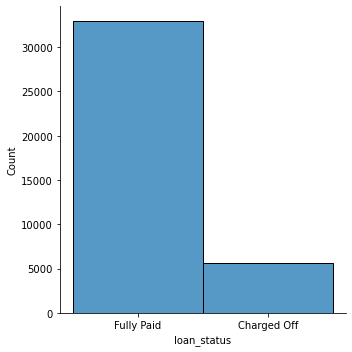

In [289]:
sns.displot(x = 'loan_status', data  = Loan_dt_set);

In [299]:
#Univariate analysis for Charged-off and Fully Paid  Loan
#Conclusion: Provides the holistic picture of two type of loan status-Charged off and Fully Paid
chargedoff = graphobj.Bar(
                        x = Loan_dt_set[Loan_dt_set["loan_status"]=="Charged Off"]["loan_status"].value_counts().index.values,
                        y = Loan_dt_set[Loan_dt_set["loan_status"]=="Charged Off"]["loan_status"].value_counts().values,
                        name="Loan waived off"
                        )
fullypaid = graphobj.Bar(
                        x = Loan_dt_set[Loan_dt_set["loan_status"]=="Fully Paid"]["loan_status"].value_counts().index.values,
                        y = Loan_dt_set[Loan_dt_set["loan_status"]=="Fully Paid"]["loan_status"].value_counts().values,
                        name="Loan Paid"

                        )

data = [chargedoff,fullypaid]
layout = graphobj.Layout()

layout = graphobj.Layout(
                        yaxis = dict(title='Count'),
                        xaxis = dict(title='Loan Status'),
                        title="Loan Status- Charged off Vs Fully Paid"
                        )
fig = graphobj.Figure(data=data,layout=layout)
py.iplot(fig,filename="Loan Status- Charged off Vs Fully Paid")
                    

In [298]:
##Check the Loan status by Loan purpose.It will gives holistic view of status for each Loan status 
#Bivariate analysis of Loan status(Charged off and Fully Paid) with various type of purpose(Loan_Purpose)
#Conclusion: From the Histogram chart, debdt consolidation type is majoraly contributing to charged off loans
df_charged_off  = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']['Loan_purpose'].values.tolist()
df_fully_paid   = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']['Loan_purpose'].values.tolist()
df_loan_purpose = Loan_dt_set['Loan_purpose']

#Plot for Charged off
grph1 = graphobj.Histogram(
                        x = df_fully_paid,
                        histfunc="count",
                        name="Fully paid loan"
                          )
#Second plot
grph2 = graphobj.Histogram(
                        x = df_charged_off,
                        histfunc ="count",
                        name="Charged off loan"

                          )
#third plot
grph3 = graphobj.Histogram(
                        x = df_loan_purpose,
                         histfunc ="count",
                        name = "Over all Loan Purpose"

                         )

#create the grid

fig = tls.make_subplots(
                        rows = 2,
                        cols = 2,
                        specs=[[{},{}],[{'colspan':2},None]],
                        subplot_titles=('Fully Paid','Charged Off','Overall')

                        )
#append  them now
fig.append_trace(grph1,1,1)
fig.append_trace(grph2,1,2)
fig.append_trace(grph3,2,1)

fig['layout'].update(showlegend=True,title="Loan Status",bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')



In [292]:
#Bivariate ..analysis showing the loan status depending on CTC. It shows chardged off are more than fully paid loan.
#conclusion: Below visulization gives how CTC is impacting the loan status i.e.charged off loan and Fully Loan


df_charged_off = Loan_dt_set[Loan_dt_set["loan_status"]=='Charged Off']
df_fully_paid  = Loan_dt_set[Loan_dt_set["loan_status"]=='Fully Paid']

#append  them now
#print(df_charged_off["Barower_CTC"])

#Plot for Charged off
grph1 = graphobj.Histogram(
                        x = df_fully_paid["Barower_CTC"],
                        histfunc="count",
                        name="Fully paid loan",nbinsx=30
                          )

#Plot for Charged off
grph2 = graphobj.Histogram(
                        x = df_charged_off["Barower_CTC"],
                        histfunc="count",
                        name="Charged off loan",nbinsx=30
                          )

fig = tls.make_subplots(
                        rows = 2,
                        cols = 2,
                        specs=[[{},{}],[{'colspan':2},None]],
                        subplot_titles=('Fully Paid','Charged Off')

                        )
fig.append_trace(grph1,1,1)
fig.append_trace(grph2,1,2)

fig['layout'].update(showlegend=True,title="Loan Status",bargap=0)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

plt.show()


In [293]:
#Bivariate analysis to see Loan distrubution state wise to check which state has highest number of loan charged off count
#Below visualization gives the an idea on how Barrower state and Loan status(Charged off and Fully paid) linked 

df_charged_off = Loan_dt_set[Loan_dt_set["loan_status"]=='Charged Off']
df_fully_paid  = Loan_dt_set[Loan_dt_set["loan_status"]=='Fully Paid']

grph1 = graphobj.Histogram(
                        x = df_fully_paid["Barower_State"],
                        histfunc="count",
                        name="Fully paid loan",nbinsx=30
                          )

#Plot for Charged off
grph2 = graphobj.Histogram(
                        x = df_charged_off["Barower_State"],
                        histfunc="count",
                        name="Charged off loan",nbinsx=30
                          )

fig = tls.make_subplots(
                        rows = 2,
                        cols = 2,
                        specs=[[{},{}],[{'colspan':2},None]],
                        subplot_titles=('Fully Paid','Charged Off')

                        )
fig.append_trace(grph1,1,1)
fig.append_trace(grph2,1,2)

fig['layout'].update(showlegend=True,title="Loan Status",bargap=0)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

plt.show()



In [294]:
##Check the Loan status by Loan purpose.It will gives holistic view of status for each Loan status 
#Bivariate analysis of Loan status(Charged off and Fully Paid) with top three states(CA,FL and NA) 
#Conclusion: From the Histogram chart, gives the visualization of three states with loan charged off view.

df_CA_st = Loan_dt_set[Loan_dt_set["Barower_State"]=='CA']
df_FL_st  = Loan_dt_set[Loan_dt_set["Barower_State"]=='FL']
df_NY_st  = Loan_dt_set[Loan_dt_set["Barower_State"]=='NY']

# get the charged off data set
df_CA_chargedoff = df_CA_st[df_CA_st["loan_status"]=="Charged Off"]
df_FL_chargedoff = df_FL_st[df_FL_st["loan_status"]=="Charged Off"]
df_NA_chargedoff = df_NY_st[df_NY_st["loan_status"]=="Charged Off"]
print(df_CA_chargedoff["Loan_purpose"].values)

grph1 = graphobj.Histogram(
                        x = df_CA_chargedoff["Loan_purpose"],
                        histfunc="count",
                        name="California State",nbinsx=30
                          )

#Plot for Charged off
grph2 = graphobj.Histogram(
                        x = df_FL_chargedoff["Loan_purpose"],
                        histfunc="count",
                        name="Florida state",nbinsx=30
                          )

#Plot for Charged off
grph3 = graphobj.Histogram(
                        x = df_NA_chargedoff["Loan_purpose"],
                        histfunc="count",
                        name="Newyork state",nbinsx=30
                          )

fig = tls.make_subplots(
                        rows = 2,
                        cols = 2,
                        specs=[[{},{}],[{'colspan':2},None]],
                        subplot_titles=('Charged off Loan Status','Charged off Loan Status',"Charged off Loan Status")

                        )
fig.append_trace(grph1,1,1)
fig.append_trace(grph2,1,2)
fig.append_trace(grph3,2,1)


fig['layout'].update(showlegend=True,title="Loan Status",bargap=0)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

plt.show()


['small_business' 'other' 'major_purchase' ... 'other' 'small_business'
 'moving']


In [295]:
#Bivariae analysis using Home ownership and Loan status
#Below visualization gives the holistic view of various types barrower home ownership and how its linked with Loan status(charged off and Fully pad)


# get the charged off data set
df_chargedoff = Loan_dt_set[Loan_dt_set["loan_status"]=="Charged Off"]
#get the dataset depending upon the type of ownership

df_rent_ownership_set     = df_chargedoff[df_chargedoff['home_ownership']=='RENT']
df_own_ownership_set      = df_chargedoff[df_chargedoff['home_ownership']=='OWN']
df_mortgage_ownership_set = df_chargedoff[df_chargedoff['home_ownership']=='MORTGAGE']
df_other_ownership_set    = df_chargedoff[df_chargedoff['home_ownership']=='OTHER']


grph1 = graphobj.Histogram(
                        x = df_rent_ownership_set["Loan_purpose"],
                        histfunc="count",
                        name="Ownership type",nbinsx=30
                          )

#Plot for Charged off
grph2 = graphobj.Histogram(
                        x = df_own_ownership_set["Loan_purpose"],
                        histfunc="count",
                        name="Ownership type",nbinsx=30
                          )

#Plot for Charged off
grph3 = graphobj.Histogram(
                        x = df_mortgage_ownership_set["Loan_purpose"],
                        histfunc="count",
                        name="Ownership type",nbinsx=30
                          )

#Plot for Charged off
grph4 = graphobj.Histogram(
                        x = df_other_ownership_set["Loan_purpose"],
                        histfunc="count",
                        name="Ownership type",nbinsx=30
                          )

fig = tls.make_subplots(
                        rows = 4,
                        cols = 4,
                        subplot_titles=('Rent','Own',"Mortgage","Other")

                        )
fig.append_trace(grph1,1,1)
fig.append_trace(grph2,1,2)
fig.append_trace(grph3,1,3)
fig.append_trace(grph4,1,4)


fig['layout'].update(showlegend=True,title="Loan Status",bargap=0)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

plt.show()


In [327]:
#Bivariae analysis with monthly debt pyment ration and loan status.Created monthly debt ration group to have inference
#Below visualization, helps to infere with ratio raning from 0-20 are more defaulters and charged off loans

# get the charged off data set

month_debt_ratio_intervals =(5,10,15,20,25,30)
user_categories= ['Excellent','VGood','Good','OK',"Bad"]

Loan_dt_set["Ratio_cate"] = pd.cut(Loan_dt_set.Brwr_monthy_debt_pymt_ratio, month_debt_ratio_intervals, labels=user_categories,right=False)

X0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["Ratio_cate"].value_counts().index.values
Y0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["Ratio_cate"].value_counts().values

X1  = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["Ratio_cate"].value_counts().index.values
Y1 =  Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["Ratio_cate"].value_counts().values


#First plot
bar0 = graphobj.Bar(
                    x = X0,
                    y = Y0,
                    name="Charged Off loan "
                    )

bar1 = graphobj.Bar(
                    x = X1,
                    y = Y1,
                    name="Fully Paid"
                    )


data=[bar1,bar0]

layout = graphobj.Layout(
                        xaxis_title='Interest Rate',
                        yaxis_title ="Count of Loans",
                        title='Interest rate Vs Loan status'
                        )
fig = graphobj.Figure(data=data,layout=layout)

py.iplot(fig,filename='grouped-bar')
plt.show()



In [329]:
#Bivariae analysis with monthly debt pyment ration and loan status.Created monthly debt ration group to have inference
#Below visualization, helps to infere with ratio raning from 0-20 are more defaulters and charged off loans

# get the charged off data set 

#This code is not working 

interest_rate_intervals =(5,10,15,20,25)
user_categories= ['LowRate','MediumRate','HighRate','VHighRate']

Loan_dt_set["Interest_Rate_Range"] = pd.cut(Loan_dt_set.int_rate, interest_rate_intervals, labels=user_categories,right=False)

X0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["Interest_Rate_Range"].value_counts().index.values
Y0 = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Charged Off']["Interest_Rate_Range"].value_counts().values

X1  = Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["Interest_Rate_Range"].value_counts().index.values
Y1 =  Loan_dt_set.loc[Loan_dt_set["loan_status"]=='Fully Paid']["Interest_Rate_Range"].value_counts().values


#First plot
bar0 = graphobj.Bar(
                    x = X0,
                    y = Y0,
                    name="Charged Off loan "
                    )

bar1 = graphobj.Bar(
                    x = X1,
                    y = Y1,
                    name="Fully Paid"
                    )


data=[bar1,bar0]

layout = graphobj.Layout(
                        xaxis_title='Interest Rate',
                        yaxis_title ="Count of Loans",
                        title='Interest rate Vs Loan status'
                        )
fig = graphobj.Figure(data=data,layout=layout)

py.iplot(fig,filename='grouped-bar')
plt.show()


TypeError: '<' not supported between instances of 'int' and 'str'

In [333]:
import os
  
my_path = os.path.abspath(os.path.dirname(__file__))
path = os.path.join(my_path, "../data/test.csv")

NameError: name '__file__' is not defined